In [1]:
import matplotlib.pyplot as plt
import pickle
import numpy as np
import pandas as pd

# Create ICA explanation plots

In [7]:
tweet_embeddings = np.load('tweet_embed_A.npy')

In [11]:
topic_list = ['Topic{}'.format(i+1) for i in range(tweet_embeddings.shape[1])]

In [14]:
topic_array = np.array(topic_list)

In [15]:
# sort topics that are most important for tweet 0
topic_array[np.argsort(tweet_embeddings[0,:])[::-1]][:10] # NOTE: sorting by value, not magnitude

array(['Topic173', 'Topic179', 'Topic210', 'Topic213', 'Topic90',
       'Topic235', 'Topic215', 'Topic245', 'Topic118', 'Topic158'],
      dtype='<U8')

In [38]:
np.argsort(tweet_embeddings[0,:])[::-1][:10]

array([172, 178, 209, 212,  89, 234, 214, 244, 117, 157])

In [39]:
np.argsort(abs(tweet_embeddings[0,:]))[::-1][:10]

array([172, 178, 209, 212, 233, 249, 110,  89, 234, 231])

In [43]:
tweet_embeddings[0,:][np.argsort(tweet_embeddings[0,:])[::-1][:10]]

array([0.1082229 , 0.0860253 , 0.08285436, 0.07957474, 0.05476972,
       0.05398186, 0.05311001, 0.05215782, 0.05190236, 0.04875122])

In [57]:
# sort all tweets at once (sort by value); get top 5 topics
tweet_topics_val = np.flip(np.argsort(tweet_embeddings, 1), 1)[:,:5]
tweet_topic_names_val = topic_array[tweet_topics_val]

# get topic weights
tweet_topics_weights_val = np.zeros(5)

for i in range(tweet_embeddings.shape[0]):
    embed = tweet_embeddings[i,:]
    idx = tweet_topics_val[i,:]
    extracted = embed[idx]
    
    if i == 0:
        tweet_topics_weights_val = extracted
    else:
        tweet_topics_weights_val = np.vstack((tweet_topics_weights_val, extracted))

In [58]:
# sort all tweets at once (sort by magnitude); get top 5 topics
tweet_topics_mag = np.flip(np.argsort(abs(tweet_embeddings), 1), 1)[:,:5]
tweet_topic_names_mag = topic_array[tweet_topics_mag]

# get topic weights
tweet_topics_weights_mag = np.zeros(5)

for i in range(tweet_embeddings.shape[0]):
    embed = tweet_embeddings[i,:]
    idx = tweet_topics_mag[i,:]
    extracted = embed[idx]
    
    if i == 0:
        tweet_topics_weights_mag = extracted
    else:
        tweet_topics_weights_mag = np.vstack((tweet_topics_weights_mag, extracted))

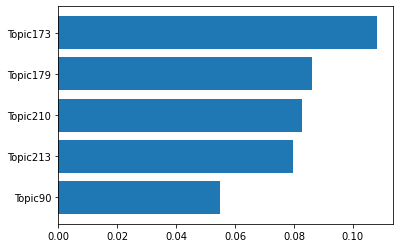

In [60]:
# example plot for tweet 0, top 5 topics sorted by value
y_pos = np.arange(5)

fig, axs = plt.subplots()
axs.barh(y_pos, tweet_topics_weights_val[0])
axs.set_yticks(y_pos)
axs.set_yticklabels(tweet_topic_names_val[0])
axs.invert_yaxis()  # labels read top-to-bottom
#axs.set_title('Top 5 Topics')
#plt.savefig(fname, dpi = 300, bbox_inches = 'tight')
plt.show()

/Users/caitlinmoroney/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/Users/caitlinmoroney/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


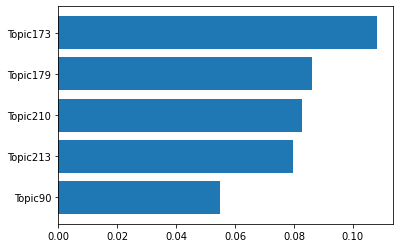

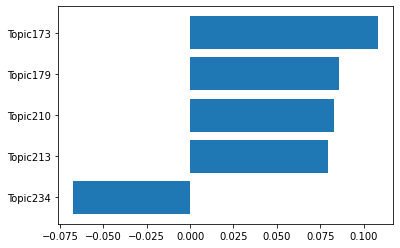

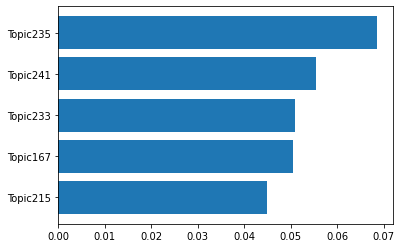

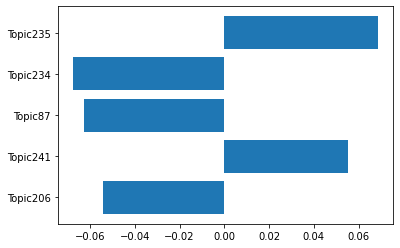

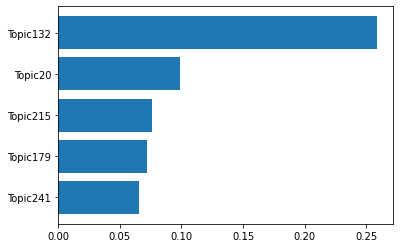

...

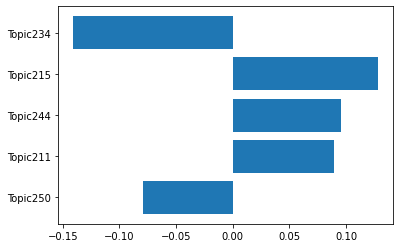

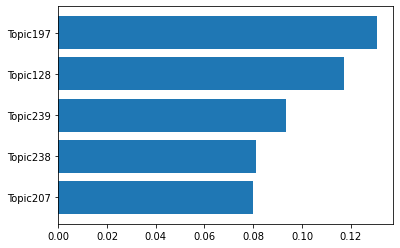

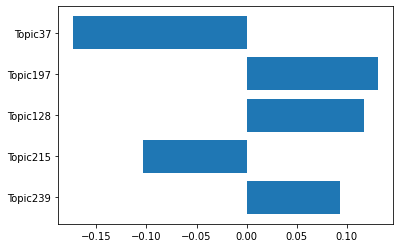

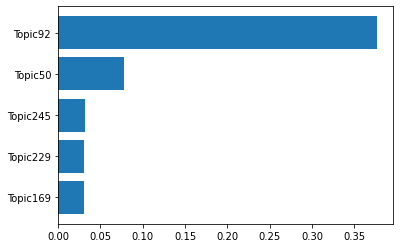

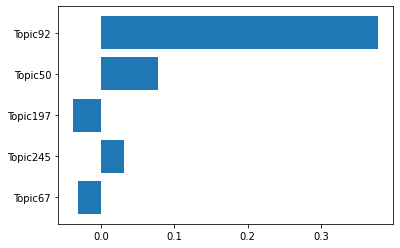

In [61]:
for i in range(tweet_embeddings.shape[0]): # iterate over tweets
    # create plot of top 5 topics sorting by value
    fname = 'tweet{}_5topics_sortval.png'.format(i)
    y_pos = np.arange(5)

    fig, axs = plt.subplots()
    axs.barh(y_pos, tweet_topics_weights_val[i])
    axs.set_yticks(y_pos)
    axs.set_yticklabels(tweet_topic_names_val[i])
    axs.invert_yaxis()  # labels read top-to-bottom
    plt.savefig(fname, dpi = 300, bbox_inches = 'tight')
    
    # create plot of top 5 topics sorting by magnitude
    fname = 'tweet{}_5topics_sortmag.png'.format(i)
    
    fig, axs = plt.subplots()
    axs.barh(y_pos, tweet_topics_weights_mag[i])
    axs.set_yticks(y_pos)
    axs.set_yticklabels(tweet_topic_names_mag[i])
    axs.invert_yaxis()  # labels read top-to-bottom
    plt.savefig(fname, dpi = 300, bbox_inches = 'tight')

# Create LIME explanation plots

In [4]:
# load A explanations & BERT explanations
with open('bert_explanations_aslist.pkl','rb') as f:
    bert_explanations = pickle.load(f)
    
with open('a_explanations_aslist.pkl','rb') as f:
    a_explanations = pickle.load(f)

In [103]:
test_bert_exp = bert_explanations[0]
bert_words = [tup[0] for tup in test_bert_exp]
bert_vals = [tup[1] for tup in test_bert_exp]
bert_df = pd.DataFrame({'terms': bert_words, 'vals': bert_vals, 'method': 'BERT'})
bert_df

,terms,vals,method
0,We,0.095386,BERT
1,refuses,0.072927,BERT
2,are,0.070003,BERT
3,in,0.066098,BERT
4,living,0.057324,BERT
5,from,0.049337,BERT
6,scary,0.043640,BERT
7,to,0.038586,BERT
8,Canadians,-0.022028,BERT
9,coronavirus,0.018908,BERT


In [104]:
test_ica_exp = a_explanations[0]
ica_words = [tup[0] for tup in test_ica_exp]
ica_vals = [tup[1] for tup in test_ica_exp]
ica_df = pd.DataFrame({'terms': ica_words, 'vals': ica_vals, 'method': 'ICA'})
ica_df

,terms,vals,method
0,refuses,0.187079,ICA
1,times,-0.110448,ICA
2,scary,0.064498,ICA
3,living,0.063963,ICA
4,protect,-0.056738,ICA
5,Canada,-0.044116,ICA
6,Canadians,-0.025968,ICA
7,coronavirus,-0.024341,ICA
8,Gov,-0.003686,ICA
9,from,-0.000663,ICA


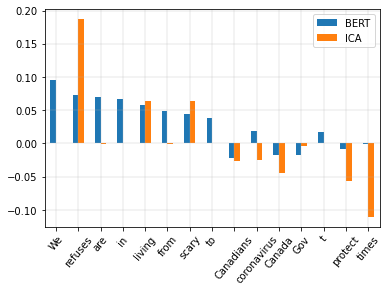

In [110]:
bert_df = pd.DataFrame({'BERT': bert_vals}, index = bert_words)
ica_df = pd.DataFrame({'ICA': ica_vals}, index = ica_words)

test_df = bert_df.merge(ica_df, left_index = True, right_index = True)
#test_df.set_index('terms', inplace = True)
ax = test_df.plot.bar(rot = 50)#,
                      #subplots = True,
                      #color = {'BERT': "red", 'ICA': "blue"})
plt.grid(True, linewidth = 0.3)

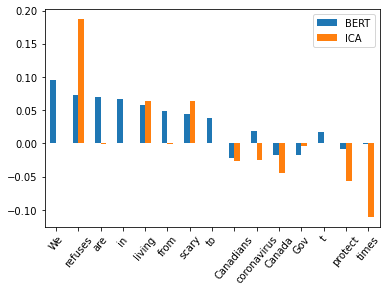

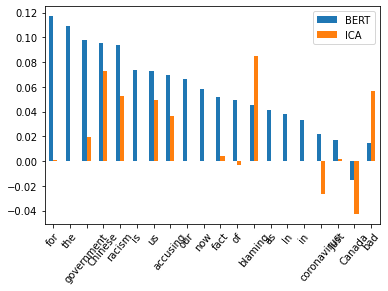

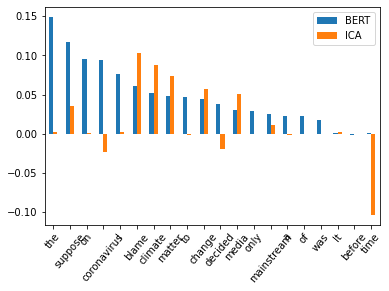

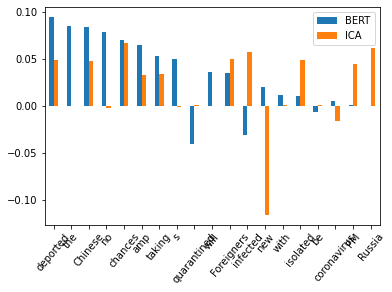

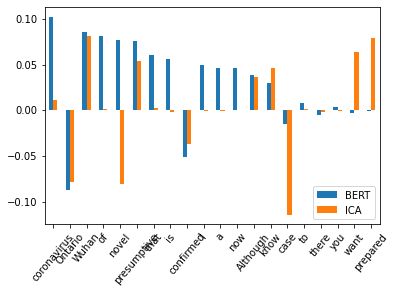

...

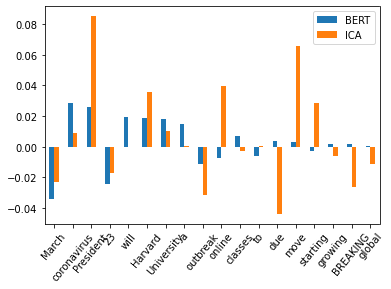

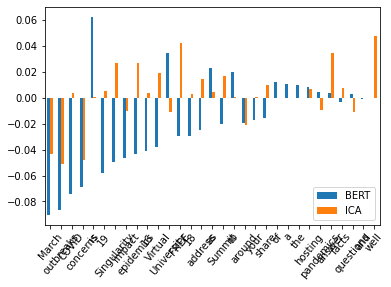

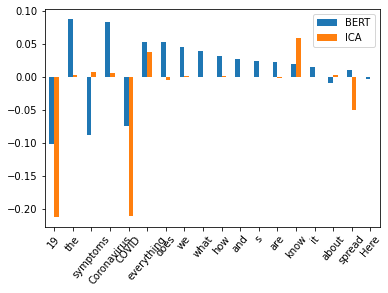

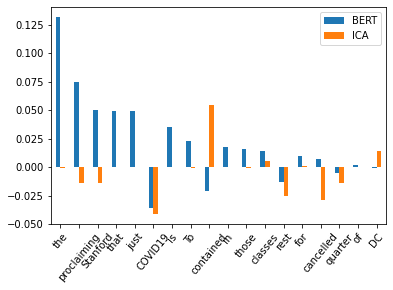

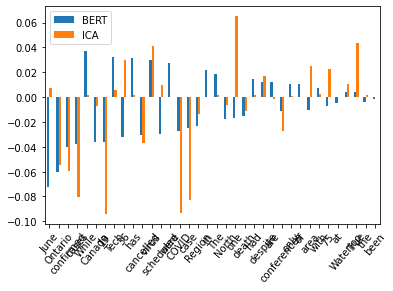

In [100]:
for i in range(tweet_embeddings.shape[0]): # iterate over tweets
    fname = './LIME_plots/tweet{}_LIME.png'.format(i)
    
    # get BERT explanation
    bert_exp = bert_explanations[i]
    bert_words = [tup[0] for tup in bert_exp]
    bert_vals = [tup[1] for tup in bert_exp]
    bert_df = pd.DataFrame({'BERT': bert_vals}, index = bert_words)
    
    # get ICA A matrix explanation
    ica_exp = a_explanations[i]
    ica_words = [tup[0] for tup in ica_exp]
    ica_vals = [tup[1] for tup in ica_exp]
    ica_df = pd.DataFrame({'ICA': ica_vals}, index = ica_words)
    
    # combine into dataframe
    full_df = bert_df.merge(ica_df, left_index = True, right_index = True)
    
    # plot values
    ax = full_df.plot.bar(rot = 50)
    plt.grid(True, linewidth = 0.3)
    plt.savefig(fname, dpi = 300, bbox_inches = 'tight')